# Automating Port Operations

## Project Statement:
Marina Pier Inc. is leveraging technology to automate their operations on the San Francisco port.

The company’s management has set out to build a bias-free/ corruption-free automatic system that reports & avoids faulty situations caused by human error.

Examples of human error include misclassifying the correct type of boat. The type of boat that enters the port region is as follows.
* Buoy
* Cruise_ship
* Ferry_boat
* Freight_boar
* Gondola
* Inflatable_boat
* Kayak
* Paper_boat
* Sailboat

Marina Pier wants to use Deep Learning techniques to build an automatic reporting system that recognizes the boat. The company is also looking to use a transfer learning approach of any lightweight pre-trained model in order to deploy in mobile devices.

As a deep learning engineer, your task is to:
1. Build a CNN network to classify the boat.
1. Build a lightweight model with the aim of deploying the solution on a mobile device using transfer learning. You can use any lightweight pre-trained model as the initial (first) layer. MobileNetV2 is a popular lightweight pre-trained model built using Keras API.

## Dataset and Data Description:
boat_type_classification_dataset.zip

The dataset contains images of 9 types of boats. It contains a total of 1162 images. The training images are provided in the directory of the specific class itself.

Classes:
* ferry_boat
* gondola
* sailboat
* cruise_ship
* kayak
* inflatable_boat
* paper_boat
* buoy
* freight_boat

## Perform the following steps:

1. Build a CNN network to classify the boat.__
    * Split the dataset into train and test in the ratio 80:20, with shuffle and random state=43.
    * Use Keras ImageDataGenerator to initialize the train generator with validation_split=0.2 and test generator. Generators are required to avoid out of memory issues while training. -- NOTE: ImageDataGenerator has been deprecataed in favor of tf.keras.utils.image_dataset_from_directory.
   https://www.tensorflow.org/api_docs/python/tf/keras/utils/image_dataset_from_directory
    * Both generators will be initialized with data normalization.
(Hint: rescale=1./255).
    * Load train, validation and test dataset in batches of 32 using the generators initialized in the above step.
    * Build a CNN network using Keras with the following layers
        - Cov2D with 32 filters, kernel size 3,3, and activation relu, followed by MaxPool2D
        - Cov2D with 32 filters, kernel size 3,3, and activation relu, followed by MaxPool2D
        - GLobalAveragePooling2D layer
        - Dense layer with 128 neurons and activation relu
        - Dense layer with 128 neurons and activation relu
        - Dense layer with 9 neurons and activation softmax.
    * Compile the model with Adam optimizer, categorical_crossentropy loss, and with metrics accuracy, precision, and recall.
    * Train the model for 20 epochs and plot training loss and accuracy against epochs.
    * Evaluate the model on test images and print the test loss and accuracy.
    * Plot heatmap of the confusion matrix and print classification report.
<br><br>
1. Build a lightweight model with the aim of deploying the solution on a mobile device using transfer learning. You can use any lightweight pre-trained model as the initial (first) layer. MobileNetV2 is a popular lightweight pre-trained model built using Keras API.
    * Split the dataset into train and test datasets in the ration 70:30, with shuffle and random state=1.
    * Use Keras ImageDataGenerator to initialize the train generator with validation_split=0.2 and test generator. Generators are required to avoid out-of-memory issues while training. -- NOTE: ImageDataGenerator has been deprecataed in favor of tf.keras.utils.image_dataset_from_directory.
   https://www.tensorflow.org/api_docs/python/tf/keras/utils/image_dataset_from_directory
    * Both generators will be initialized with data normalization.
(Hint: rescale=1./255).
    * Load train, validation and test datasets in batches of 32 using the generators initialized in the above step.
    * Build a CNN network using Keras with the following layers.
        - Load MobileNetV2 - Light Model as the first layer
(Hint: Keras API Doc)
        - GLobalAveragePooling2D layer
        - Dropout(0.2)
        - Dense layer with 256 neurons and activation relu
        - BatchNormalization layer
        - Dropout(0.1)
        - Dense layer with 128 neurons and activation relu
        - BatchNormalization layer
        - Dropout(0.1)
        - Dense layer with 9 neurons and activation softmax
    * Compile the model with Adam optimizer, categorical_crossentropy loss, and metrics accuracy, Precision, and Recall.
    * Train the model for 50 epochs and Early stopping while monitoring validation loss.
    * Evaluate the model on test images and print the test loss and accuracy.
    * Plot Train loss Vs Validation loss and Train accuracy Vs Validation accuracy.
<br><br>
1. Compare the results of both models built in steps 1 and 2 and state your observations.

In [ ]:
import datetime, os, cv2, pathlib

import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf

from tensorflow import data as tf_data
from tensorflow import keras

from keras import layers
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, GlobalAveragePooling2D
from keras.callbacks import TensorBoard
from keras.optimizers import Adam
from keras.losses import CategoricalCrossentropy
from keras.metrics import CategoricalAccuracy
from keras.applications import MobileNetV2
from keras.utils import plot_model
from keras.callbacks import ReduceLROnPlateau, EarlyStopping

from sklearn.metrics import confusion_matrix, classification_report

%load_ext tensorboard

In [ ]:
# specific to Google Colab

from google.colab import drive
drive.mount('/content/drive')

# Too slow to read files in Google Drive. Speed it up by uploading the zipped folder and unzipping it to the Colab VM

!unzip "/content/drive/My Drive/Colab Notebooks/Automating_Port_Operations_dataset.zip" -d "/content"
!unzip "/content/drive/My Drive/Colab Notebooks/boat_type_classification_dataset.zip" -d "/content"

Mounted at /content/drive
Archive:  /content/drive/My Drive/Colab Notebooks/Automating_Port_Operations_dataset.zip
   creating: /content/Automating_Port_Operations_dataset/
  inflating: /content/Automating_Port_Operations_dataset/.DS_Store  
  inflating: /content/__MACOSX/Automating_Port_Operations_dataset/._.DS_Store  
   creating: /content/Automating_Port_Operations_dataset/test/
   creating: /content/Automating_Port_Operations_dataset/test/buoy/
   creating: /content/Automating_Port_Operations_dataset/test/gondola/
   creating: /content/Automating_Port_Operations_dataset/test/ferry_boat/
  inflating: /content/Automating_Port_Operations_dataset/test/.DS_Store  
  inflating: /content/__MACOSX/Automating_Port_Operations_dataset/test/._.DS_Store  
   creating: /content/Automating_Port_Operations_dataset/test/cruise_ship/
   creating: /content/Automating_Port_Operations_dataset/test/freight_boat/
   creating: /content/Automating_Port_Operations_dataset/test/kayak/
   creating: /content/A

In [ ]:
train_dir = '/content/boat_type_classification_dataset'
test_dir = '/content/Automating_Port_Operations_dataset/test'

train_path = pathlib.Path(train_dir)
test_path = pathlib.Path(test_dir)

In [ ]:
batch_size = 32

img_height = 128
img_width = 128
image_shape = (img_width, img_height, 3)
image_size = (img_width, img_height)

In [ ]:
train_ds, val_ds = keras.utils.image_dataset_from_directory(
    train_path,
    labels='inferred',
    validation_split=0.2,
    subset="both",
    seed=42,
    image_size=image_size,
    batch_size=batch_size,
)

test_ds = keras.utils.image_dataset_from_directory(
    test_path,
    labels='inferred',
    image_size=image_size,
    batch_size=batch_size,
)

Found 1462 files belonging to 9 classes.
Using 1170 files for training.
Using 292 files for validation.
Found 239 files belonging to 9 classes.


['buoy', 'cruise ship', 'ferry boat', 'freight boat', 'gondola', 'inflatable boat', 'kayak', 'paper boat', 'sailboat']


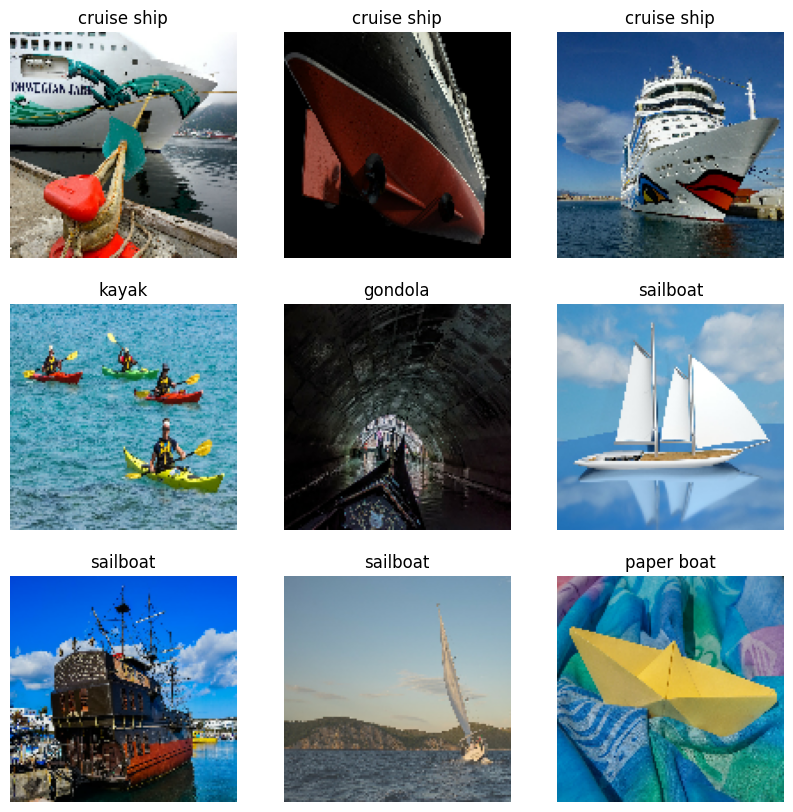

In [ ]:
class_names = train_ds.class_names
print(class_names)

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(np.array(images[i]).astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [ ]:
data_augmentation_layers = [
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
]


def data_augmentation(images):
    for layer in data_augmentation_layers:
        images = layer(images)
    return images


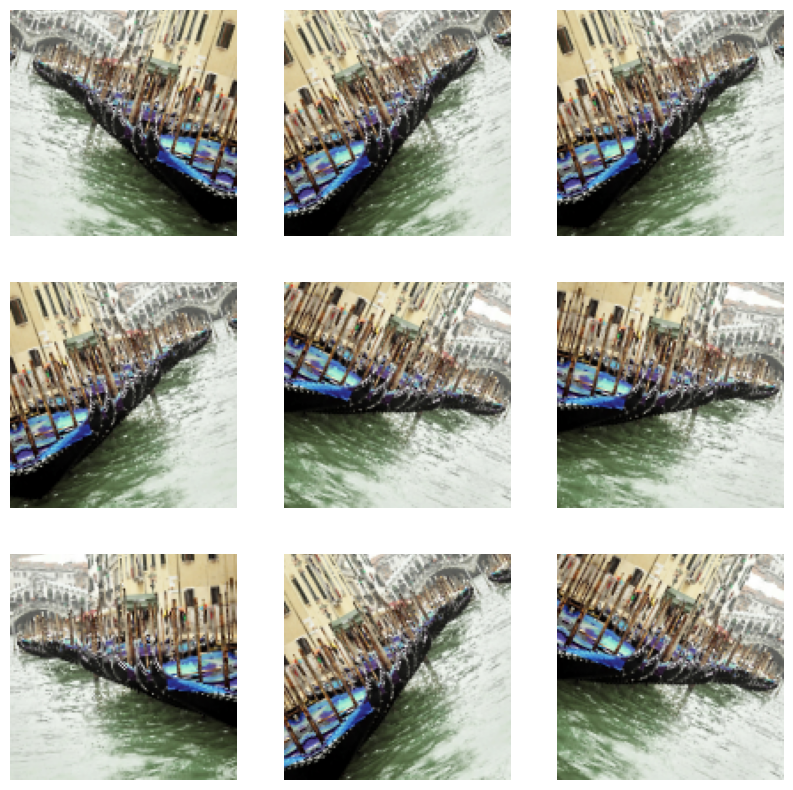

In [ ]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(np.array(augmented_images[0]).astype("uint8"))
        plt.axis("off")

In [ ]:
#TF Data

# Apply `data_augmentation` to the training images.
train_ds = train_ds.map(
    lambda img, label: (data_augmentation(img), label),
    num_parallel_calls=tf_data.AUTOTUNE,
)
# Prefetching samples in GPU memory helps maximize GPU utilization.
train_ds = train_ds.prefetch(tf_data.AUTOTUNE)
val_ds = val_ds.prefetch(tf_data.AUTOTUNE)

In [ ]:
def prepare_model():
    model = Sequential([
        tf.keras.Input(shape=image_shape),
        layers.Rescaling(1./255),
        layers.Conv2D(32,kernel_size=(3,3),activation='relu',padding='same',input_shape=image_shape),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Conv2D(32,kernel_size=(3,3),activation='relu',padding='same'),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.GlobalAveragePooling2D(),
        layers.Dense(128, activation='relu'),
        layers.Dense(128, activation='relu'),
        layers.Dense(9, activation='softmax')
    ])
    return model

In [ ]:
model = prepare_model()

model.summary()

model.compile(loss='sparse_categorical_crossentropy',optimizer=Adam(learning_rate=0.001),metrics=['accuracy'])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 128, 128, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 64, 64, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        9248      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 32, 32, 32)        0         
 g2D)                                                            
                                                                 
 global_average_pooling2d (  (None, 32)                0

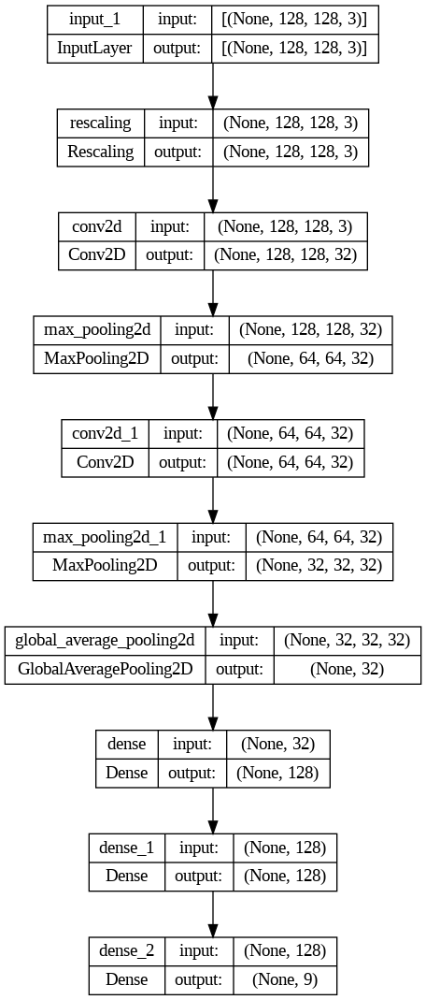

In [ ]:
plot_model(model, show_shapes=True)

In [ ]:
# Start TensorBoard to monitor the training in progress

logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = TensorBoard(logdir, histogram_freq=1)

%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
red_lr= ReduceLROnPlateau(monitor='val_accuracy',patience=3,verbose=1,factor=0.1)

In [ ]:
epochs = 20

callbacks=[tensorboard_callback, red_lr],

history = model.fit(train_ds,
                    validation_data = val_ds,
                    callbacks=callbacks,
                    epochs=epochs)

Epoch 1/20
37/37 [==============================] - 38s 912ms/step - loss: 1.9099 - accuracy: 0.3145 - val_loss: 1.7397 - val_accuracy: 0.3801 - lr: 0.0010
Epoch 2/20
37/37 [==============================] - 37s 941ms/step - loss: 1.8237 - accuracy: 0.3222 - val_loss: 1.7249 - val_accuracy: 0.3801 - lr: 0.0010
Epoch 3/20
37/37 [==============================] - 41s 1s/step - loss: 1.8142 - accuracy: 0.3222 - val_loss: 1.7200 - val_accuracy: 0.3801 - lr: 0.0010
Epoch 4/20
37/37 [==============================] - ETA: 0s - loss: 1.7891 - accuracy: 0.3282
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.
37/37 [==============================] - 35s 893ms/step - loss: 1.7891 - accuracy: 0.3282 - val_loss: 1.6735 - val_accuracy: 0.3801 - lr: 0.0010
Epoch 5/20
37/37 [==============================] - 35s 865ms/step - loss: 1.7456 - accuracy: 0.3350 - val_loss: 1.6763 - val_accuracy: 0.4144 - lr: 1.0000e-04
Epoch 6/20
37/37 [==============================] - 37s 913

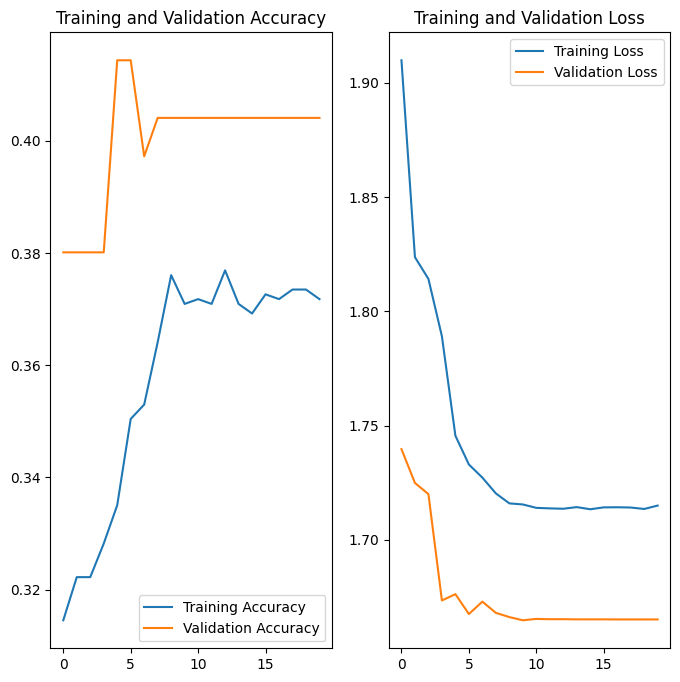

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
model.evaluate(test_ds)

8/8 [==============================] - 2s 151ms/step - loss: 1.7126 - accuracy: 0.3891


[1.712592363357544, 0.3891213536262512]

In [ ]:
y_pred = model.predict(test_ds)

8/8 [==============================] - 4s 245ms/step


In [ ]:
y_pred_max = tf.argmax(y_pred, axis=1)

true_categories = tf.concat([y for x, y in test_ds], axis=0)

cm = confusion_matrix(y_pred_max, true_categories)

print(cm)

print(y_pred)
print(y_pred_max)

[[ 0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0]
 [ 2 16  4  3 13  1  9  2 18]
 [ 0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0]
 [ 9 23  9  4 26  2 33  4 61]]
[[0.02713585 0.05358443 0.02429001 ... 0.169857   0.01214903 0.41850674]
 [0.03222007 0.09502998 0.03648401 ... 0.19191286 0.01579446 0.3032205 ]
 [0.04355497 0.05608007 0.03274772 ... 0.17319553 0.02301092 0.410722  ]
 ...
 [0.03045956 0.09100241 0.03493212 ... 0.18880188 0.01489863 0.24003303]
 [0.04065543 0.20435998 0.05977831 ... 0.15506166 0.02286393 0.43400997]
 [0.05090125 0.18279064 0.06797108 ... 0.16182482 0.03199994 0.35219458]]
tf.Tensor(
[8 4 8 4 4 8 8 4 8 8 8 4 4 4 4 8 8 8 8 4 8 8 8 4 8 8 8 8 8 8 4 8 8 8 8 4 8
 4 8 8 4 4 8 8 8 4 4 8 4 8 4 8 4 8 8 4 8 8 8 8 8 8 8 8 8 4 4 4 4 8 8 8 8 8
 8 8 8 8 4 8 4 8 8 8 4 4 8 8 8 4 8 8 8 8 8 4 8 4 8 8 8 8 4 4 4 8 4 8 8 4 8
 4 4 8 8 4 4 8 4 8 8 4 4 4 8 8 8 8 8 8 8 8 8 4 4 

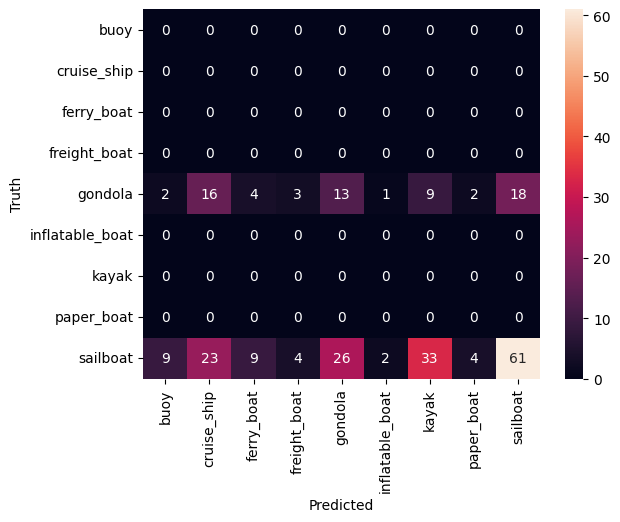

In [ ]:
sns.heatmap(data=cm, annot=True, fmt='d', xticklabels=test_ds.class_names, yticklabels=test_ds.class_names)
plt.xlabel('Predicted')
plt.ylabel('Truth')
plt.show()

In [ ]:
cr = classification_report(true_categories, y_pred_max, target_names=list(test_ds.class_names))
print(cr)

                 precision    recall  f1-score   support

           buoy       0.00      0.00      0.00        11
    cruise_ship       0.00      0.00      0.00        39
     ferry_boat       0.00      0.00      0.00        13
   freight_boat       0.00      0.00      0.00         7
        gondola       0.19      0.33      0.24        39
inflatable_boat       0.00      0.00      0.00         3
          kayak       0.00      0.00      0.00        42
     paper_boat       0.00      0.00      0.00         6
       sailboat       0.36      0.77      0.49        79

       accuracy                           0.31       239
      macro avg       0.06      0.12      0.08       239
   weighted avg       0.15      0.31      0.20       239



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


**Build a lightweight model with the aim of deploying the solution on a mobile device using transfer learning. You can use any lightweight pre-trained model as the initial (first) layer. MobileNetV2 is a popular lightweight pre-trained model built using Keras API.**


 * Load MobileNetV2 - Light Model as the first layer
(Hint: Keras API Doc)
* GLobalAveragePooling2D layer
* Dropout(0.2)
* Dense layer with 256 neurons and activation relu
* BatchNormalization layer
* Dropout(0.1)
* Dense layer with 128 neurons and activation relu
* BatchNormalization layer
* Dropout(0.1)
* Dense layer with 9 neurons and activation softmax


In [ ]:
base_model = MobileNetV2(input_shape=image_shape,
                                               include_top=False,
                                               weights='imagenet')

base_model.trainable = False

9406464/9406464 [==============================] - 0s 0us/step


In [ ]:
base_model.summary()

Model: "mobilenetv2_1.00_128"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 64, 64, 32)           864       ['input_2[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 64, 64, 32)           128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 64, 64, 32)           0         ['bn_Conv1[

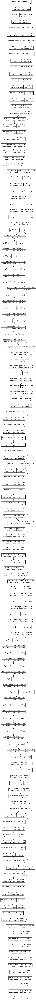

In [ ]:
plot_model(base_model, show_shapes=True)

In [ ]:
mobile_net_model = Sequential([
    tf.keras.Input(shape=image_shape),
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.2),
    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.1),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.1),
    layers.Dense(9, activation='softmax')
])

In [ ]:
mobile_net_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_128 (Func  (None, 4, 4, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d_1  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 dense_3 (Dense)             (None, 256)               327936    
                                                                 
 batch_normalization (Batch  (None, 256)               1024      
 Normalization)                                                  
                                                      

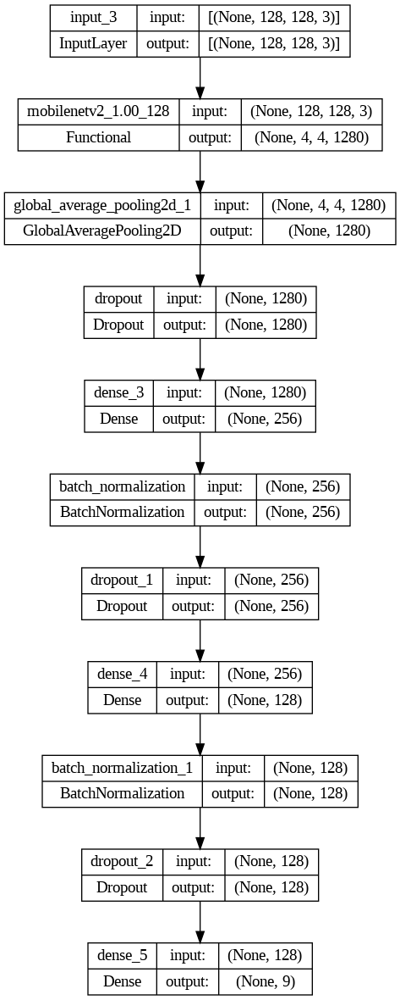

In [ ]:
plot_model(mobile_net_model, show_shapes=True)

In [ ]:
mobile_net_model.compile(loss='sparse_categorical_crossentropy',optimizer=Adam(learning_rate=0.001),metrics=['accuracy'])

In [ ]:
epochs = 50

es = EarlyStopping(
    monitor='val_loss',
    patience=2,
    verbose=0,
    mode='auto',
    baseline=None,
    restore_best_weights=False
)

callbacks=[tensorboard_callback, red_lr, es],

history_mobile = mobile_net_model.fit(train_ds,
                    validation_data = val_ds,
                    callbacks=callbacks,
                    epochs=epochs)

Epoch 1/50
37/37 [==============================] - 35s 738ms/step - loss: 2.3925 - accuracy: 0.2812 - val_loss: 2.7149 - val_accuracy: 0.2705 - lr: 0.0010
Epoch 2/50
37/37 [==============================] - 30s 737ms/step - loss: 1.8866 - accuracy: 0.4000 - val_loss: 1.8735 - val_accuracy: 0.3973 - lr: 0.0010
Epoch 3/50
37/37 [==============================] - 33s 867ms/step - loss: 1.6849 - accuracy: 0.4444 - val_loss: 1.7489 - val_accuracy: 0.4658 - lr: 0.0010
Epoch 4/50
37/37 [==============================] - 36s 942ms/step - loss: 1.5256 - accuracy: 0.4906 - val_loss: 1.6515 - val_accuracy: 0.4623 - lr: 0.0010
Epoch 5/50
37/37 [==============================] - 33s 811ms/step - loss: 1.4555 - accuracy: 0.5205 - val_loss: 1.6022 - val_accuracy: 0.4966 - lr: 0.0010
Epoch 6/50
37/37 [==============================] - 31s 752ms/step - loss: 1.4223 - accuracy: 0.5308 - val_loss: 1.4663 - val_accuracy: 0.5411 - lr: 0.0010
Epoch 7/50
37/37 [==============================] - 35s 905ms/st

In [ ]:
es.stopped_epoch

8

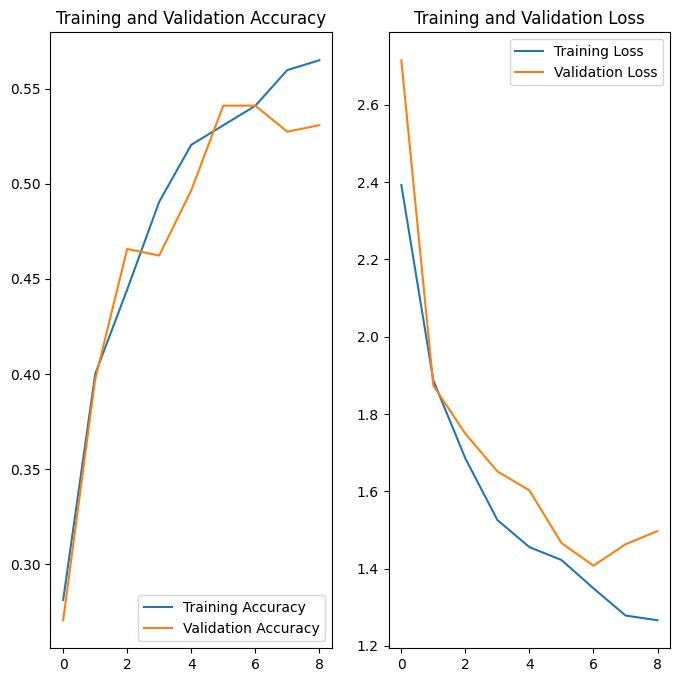

In [ ]:
acc = history_mobile.history['accuracy']
val_acc = history_mobile.history['val_accuracy']

loss = history_mobile.history['loss']
val_loss = history_mobile.history['val_loss']

epochs_range = range(es.stopped_epoch + 1)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
mobile_net_model.evaluate(test_ds)

8/8 [==============================] - 6s 485ms/step - loss: 1.1391 - accuracy: 0.6360


[1.1390708684921265, 0.6359832882881165]

In [ ]:
y_pred = mobile_net_model.predict(test_ds)

8/8 [==============================] - 4s 262ms/step


In [ ]:
y_pred_max = tf.argmax(y_pred, axis=1)

true_categories = tf.concat([y for x, y in test_ds], axis=0)

cm = confusion_matrix(y_pred_max, true_categories)

print(cm)

print(y_pred)
print(y_pred_max)

[[ 0  1  0  0  1  0  2  0  2]
 [ 2  3  2  2  4  0  7  2 14]
 [ 0  1  0  1  1  0  2  1  3]
 [ 0  0  0  0  0  0  0  0  0]
 [ 3 13  3  2  9  0  6  1 19]
 [ 0  0  0  0  0  0  0  0  0]
 [ 2  4  1  1  8  2 10  1  7]
 [ 0  0  0  0  1  0  0  0  0]
 [ 4 17  7  1 15  1 15  1 34]]
[[0.00514658 0.06758758 0.8104695  ... 0.00513635 0.00241823 0.03155546]
 [0.00735636 0.01894921 0.00553391 ... 0.19302104 0.00238218 0.757704  ]
 [0.016629   0.04181445 0.08563968 ... 0.47691974 0.00240317 0.2575619 ]
 ...
 [0.01106154 0.22024342 0.02738728 ... 0.28191397 0.02634384 0.34713942]
 [0.01989185 0.04666848 0.03517386 ... 0.50574535 0.00706049 0.01148523]
 [0.00118217 0.35261995 0.0529846  ... 0.01413246 0.00141616 0.5625586 ]]
tf.Tensor(
[2 8 6 8 2 8 1 4 1 8 8 4 6 6 6 1 0 6 1 4 8 2 4 4 8 8 8 8 8 1 1 1 8 8 6 8 1
 8 8 4 8 6 6 8 4 4 4 8 1 1 8 1 0 4 4 6 8 4 6 6 1 1 8 6 6 4 4 4 4 8 8 4 4 4
 6 8 4 8 6 8 8 8 8 1 8 8 1 7 6 8 4 8 8 4 6 8 1 4 8 4 8 8 8 8 4 1 8 8 6 8 4
 2 8 8 4 1 4 8 0 8 1 1 1 6 8 8 1 8 6 1 8 8 4 6 0 

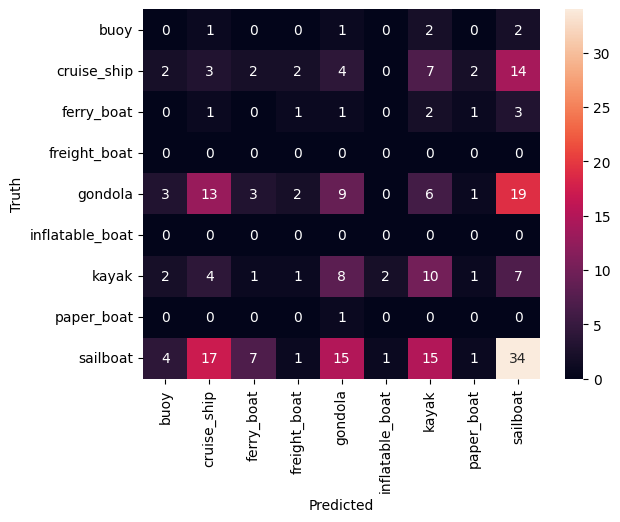

In [ ]:
sns.heatmap(data=cm, annot=True, fmt='d', xticklabels=test_ds.class_names, yticklabels=test_ds.class_names)
plt.xlabel('Predicted')
plt.ylabel('Truth')
plt.show()

In [ ]:
cr = classification_report(true_categories, y_pred_max, target_names=list(test_ds.class_names))
print(cr)

                 precision    recall  f1-score   support

           buoy       0.00      0.00      0.00        11
    cruise_ship       0.08      0.08      0.08        39
     ferry_boat       0.00      0.00      0.00        13
   freight_boat       0.00      0.00      0.00         7
        gondola       0.16      0.23      0.19        39
inflatable_boat       0.00      0.00      0.00         3
          kayak       0.28      0.24      0.26        42
     paper_boat       0.00      0.00      0.00         6
       sailboat       0.36      0.43      0.39        79

       accuracy                           0.23       239
      macro avg       0.10      0.11      0.10       239
   weighted avg       0.21      0.23      0.22       239



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# Optional: export it as tensorflow lite

converter = tf.lite.TFLiteConverter.from_keras_model(mobile_net_model)
tflite_model = converter.convert()

with open('model.tflite', 'wb') as f:
  f.write(tflite_model)

# **Observations**

The second model we tried, with MobileNetV2, shows significantly better performance. However, its performance still is not ideal as we should see a lot better scores.

In order to improve performance, I would have to significantly deviate from the instruction for the project, e.g. by adding more dense layers, more Conv2D layers etc. I already did by not using the deprecated ImageDataGenerator and decided not to deviate much further.

Other than that, we could use more data points and increase the size of training dataset